# Feature Engineering and Creation

## Imports and Setup

In [1]:
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from collections import Counter
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.feature_selection import SelectKBest

from sklearn.preprocessing import StandardScaler, OrdinalEncoder

sns.set(style='darkgrid', palette='pastel')
pd.options.display.max_columns = None

In [2]:
data = pd.read_csv('../data/processed/0_cleaned.csv')
data_backup = data.copy()

label = data[['Value', 'Wage']]
data.drop(columns=['Value', 'Wage'], inplace=True)

In [3]:
data.head(5)

,Age,Nationality,Overall,Potential,Club,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
0,31.0,Argentina,94.0,94.0,FC Barcelona,2202.0,Left,5.0,4.0,4.0,Medium/ Medium,Messi,RF,10.0,170.18,159.0,88.0,88.0,88.0,92.0,93.0,93.0,93.0,92.0,93.0,93.0,93.0,91.0,84.0,84.0,84.0,91.0,64.0,61.0,61.0,61.0,64.0,59.0,47.0,47.0,47.0,59.0,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0
1,33.0,Portugal,94.0,94.0,Juventus,2228.0,Right,5.0,4.0,5.0,High/ Low,C. Ronaldo,ST,7.0,187.96,183.0,91.0,91.0,91.0,89.0,90.0,90.0,90.0,89.0,88.0,88.0,88.0,88.0,81.0,81.0,81.0,88.0,65.0,61.0,61.0,61.0,65.0,61.0,53.0,53.0,53.0,61.0,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0
2,26.0,Brazil,92.0,93.0,Paris Saint-Germain,2143.0,Right,5.0,5.0,5.0,High/ Medium,Neymar,LW,10.0,175.26,150.0,84.0,84.0,84.0,89.0,89.0,89.0,89.0,89.0,89.0,89.0,89.0,88.0,81.0,81.0,81.0,88.0,65.0,60.0,60.0,60.0,65.0,60.0,47.0,47.0,47.0,60.0,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0
3,27.0,Spain,91.0,93.0,Manchester United,1471.0,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,193.04,168.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0
4,27.0,Belgium,91.0,92.0,Manchester City,2281.0,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,180.34,154.0,82.0,82.0,82.0,87.0,87.0,87.0,87.0,87.0,88.0,88.0,88.0,88.0,87.0,87.0,87.0,88.0,77.0,77.0,77.0,77.0,77.0,73.0,66.0,66.0,66.0,73.0,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0


In [4]:
label.isnull().sum()

Value    0
Wage     0
dtype: int64


## Transform Categorical Features

In [20]:
categorical_columns = np.asarray([not np.issubdtype(data[col].dtype, np.number) for col in data.columns], dtype=np.bool)
cat_col_names = [col for col in data.columns if not np.issubdtype(data[col].dtype, np.number)]
num_col_names = [col for col in data.columns if np.issubdtype(data[col].dtype, np.number)]

categorical_data = data.iloc[:, categorical_columns]
non_categorical = data.iloc[:, ~categorical_columns]
categorical_data.reset_index(inplace=True, drop=True)
non_categorical.reset_index(inplace=True, drop=True)

### Transform Using OneHotEncoding

In [47]:
cardinality_threshold = 10
cols_to_reduce_dim = []
for c in cat_col_names:
    levels = categorical_data[c].drop_duplicates().shape[0]
    if levels > cardinality_threshold:
        cols_to_reduce_dim.append(c)      

df_reduce = categorical_data[cols_to_reduce_dim]
df_reduce = pd.get_dummies(df_reduce)

svd = PCA(n_components=0.85)
df_reduce = svd.fit_transform(df_reduce)

column_names = []
for col in range(df_reduce.shape[1]):
    column_names.append('reduced_col_{}'.format(col))
df_reduce = pd.DataFrame(df_reduce, columns=column_names)

df_dummies = categorical_data.drop(cols_to_reduce_dim, axis=1)
df_dummies = pd.get_dummies(df_dummies)

df_dummies = df_dummies.join(df_reduce)
df_dummies = df_dummies.join(non_categorical)

### Transform Using Ordinal Encoding

In [48]:
encoder = OrdinalEncoder()
encoder.fit(categorical_data)
column_names = categorical_data.columns
categorical_data = encoder.transform(categorical_data)
df_ordinal = pd.DataFrame(categorical_data, columns=column_names)
del categorical_data
df_ordinal = non_categorical.join(df_ordinal)
del non_categorical

## Normalize Data

### Normalize Ordinal Encoded Data

In [49]:
scaler = StandardScaler()
column_names = df_ordinal.columns
df_ordinal = scaler.fit_transform(df_ordinal)
df_ordinal = pd.DataFrame(df_ordinal, columns=column_names)
df_ordinal.head()
del column_names

### Normalize One Hot Encoded Data

In [50]:
scaler = StandardScaler()
column_names = df_dummies.columns
df_dummies = scaler.fit_transform(df_dummies)
df_dummies = pd.DataFrame(df_dummies, columns=column_names)
df_dummies.head()
del column_names

In [51]:
df_dummies.head()

,Preferred Foot_Left,Preferred Foot_Right,Work Rate_High/ High,Work Rate_High/ Low,Work Rate_High/ Medium,Work Rate_Low/ High,Work Rate_Low/ Low,Work Rate_Low/ Medium,Work Rate_Medium/ High,Work Rate_Medium/ Low,Work Rate_Medium/ Medium,Body Type_Akinfenwa,Body Type_C. Ronaldo,Body Type_Courtois,Body Type_Lean,Body Type_Messi,Body Type_Neymar,Body Type_Normal,Body Type_PLAYER_BODY_TYPE_25,Body Type_Shaqiri,Body Type_Stocky,reduced_col_0,reduced_col_1,reduced_col_2,reduced_col_3,reduced_col_4,reduced_col_5,reduced_col_6,reduced_col_7,reduced_col_8,reduced_col_9,reduced_col_10,reduced_col_11,reduced_col_12,reduced_col_13,reduced_col_14,reduced_col_15,reduced_col_16,reduced_col_17,reduced_col_18,reduced_col_19,reduced_col_20,reduced_col_21,reduced_col_22,reduced_col_23,reduced_col_24,reduced_col_25,reduced_col_26,reduced_col_27,reduced_col_28,reduced_col_29,reduced_col_30,reduced_col_31,reduced_col_32,reduced_col_33,reduced_col_34,reduced_col_35,reduced_col_36,reduced_col_37,reduced_col_38,reduced_col_39,reduced_col_40,reduced_col_41,reduced_col_42,reduced_col_43,reduced_col_44,reduced_col_45,reduced_col_46,reduced_col_47,reduced_col_48,reduced_col_49,reduced_col_50,reduced_col_51,reduced_col_52,reduced_col_53,reduced_col_54,reduced_col_55,reduced_col_56,reduced_col_57,reduced_col_58,reduced_col_59,reduced_col_60,reduced_col_61,reduced_col_62,reduced_col_63,reduced_col_64,reduced_col_65,reduced_col_66,reduced_col_67,reduced_col_68,reduced_col_69,reduced_col_70,reduced_col_71,reduced_col_72,reduced_col_73,reduced_col_74,reduced_col_75,reduced_col_76,reduced_col_77,reduced_col_78,reduced_col_79,reduced_col_80,reduced_col_81,reduced_col_82,reduced_col_83,reduced_col_84,reduced_col_85,reduced_col_86,reduced_col_87,reduced_col_88,reduced_col_89,reduced_col_90,reduced_col_91,reduced_col_92,reduced_col_93,reduced_col_94,reduced_col_95,reduced_col_96,reduced_col_97,reduced_col_98,reduced_col_99,reduced_col_100,reduced_col_101,reduced_col_102,reduced_col_103,reduced_col_104,reduced_col_105,reduced_col_106,reduced_col_107,reduced_col_108,reduced_col_109,reduced_col_110,reduced_col_111,reduced_col_112,reduced_col_113,reduced_col_114,reduced_col_115,reduced_col_116,reduced_col_117,reduced_col_118,reduced_col_119,reduced_col_120,reduced_col_121,reduced_col_122,reduced_col_123,reduced_col_124,reduced_col_125,reduced_col_126,reduced_col_127,reduced_col_128,reduced_col_129,reduced_col_130,reduced_col_131,reduced_col_132,reduced_col_133,reduced_col_134,reduced_col_135,reduced_col_136,reduced_col_137,reduced_col_138,reduced_col_139,reduced_col_140,reduced_col_141,reduced_col_142,reduced_col_143,reduced_col_144,reduced_col_145,reduced_col_146,reduced_col_147,reduced_col_148,reduced_col_149,reduced_col_150,reduced_col_151,reduced_col_152,reduced_col_153,reduced_col_154,reduced_col_155,reduced_col_156,reduced_col_157,reduced_col_158,reduced_col_159,reduced_col_160,reduced_col_161,reduced_col_162,reduced_col_163,reduced_col_164,reduced_col_165,reduced_col_166,reduced_col_167,reduced_col_168,reduced_col_169,reduced_col_170,reduced_col_171,reduced_col_172,reduced_col_173,reduced_col_174,reduced_col_175,reduced_col_176,reduced_col_177,reduced_col_178,reduced_col_179,reduced_col_180,reduced_col_181,reduced_col_182,reduced_col_183,reduced_col_184,reduced_col_185,reduced_col_186,reduced_col_187,reduced_col_188,reduced_col_189,reduced_col_190,reduced_col_191,reduced_col_192,reduced_col_193,reduced_col_194,reduced_col_195,reduced_col_196,reduced_col_197,reduced_col_198,reduced_col_199,reduced_col_200,reduced_col_201,reduced_col_202,reduced_col_203,reduced_col_204,reduced_col_205,reduced_col_206,reduced_col_207,reduced_col_208,reduced_col_209,reduced_col_210,reduced_col_211,reduced_col_212,reduced_col_213,reduced_col_214,reduced_col_215,reduced_col_216,reduced_col_217,reduced_col_218,reduced_col_219,reduced_col_220,reduced_col_221,reduced_col_222,reduced_col_223,reduced_col_224,reduced_col_225,reduced_col_226,reduced_col_227,reduced_col_228,reduced_col_229,red

## Data Boxplot

In [39]:
def get_boxpolt_info(data, size=[10,5], axis_rotation=0):
    plt.rcParams['figure.figsize'] = size
    ax = sns.boxplot(data=data)
    plt.title('Numerical Features Distribution')
    if axis_rotation:
        plt.xticks(rotation=axis_rotation)
    plt.show()

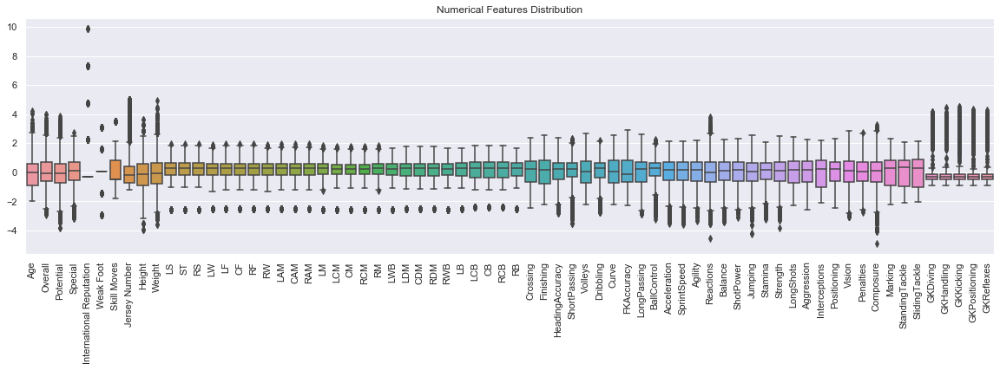

In [40]:
get_boxpolt_info(df_ordinal[num_col_names], size=(20, 5), axis_rotation=90)

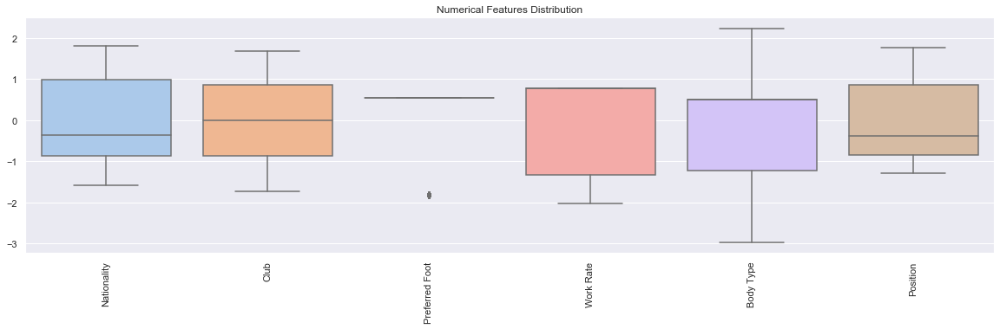

In [41]:
get_boxpolt_info(df_ordinal[cat_col_names], size=(20, 5), axis_rotation=90)

In [53]:
df_ordinal.reset_index(inplace=True, drop=True)
df_dummies.reset_index(inplace=True, drop=True)

In [54]:
label.reset_index(inplace=True, drop=True)

In [ ]:
df_ordinal_final = df_ordinal.join(label)
df_ordinal_final.to_csv('./data/processed/1_1_processed_ordinal_encoding.csv', index_label=False)

In [55]:
df_dummies_final = df_dummies.join(label)
df_dummies_final.to_csv('../data/processed/1_1_processed_onehot_encoding.csv', index_label=False)